In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [58]:
bank_customers = pd.read_csv("BankChurners.csv")
bank_customers.drop("Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1",axis=1,inplace=True)
bank_customers.drop("Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2", axis=1, inplace=True)
bank_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [59]:
bank_customers.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,...,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,...,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,...,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,...,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [60]:
bank_customers['Attrition_Flag'].value_counts

<bound method IndexOpsMixin.value_counts of 0        Existing Customer
1        Existing Customer
2        Existing Customer
3        Existing Customer
4        Existing Customer
               ...        
10122    Existing Customer
10123    Attrited Customer
10124    Attrited Customer
10125    Attrited Customer
10126    Attrited Customer
Name: Attrition_Flag, Length: 10127, dtype: object>

In [61]:
bank_customers.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


In [62]:
from sklearn.model_selection import StratifiedShuffleSplit
split =StratifiedShuffleSplit(n_splits=1,test_size=0.2,random_state=42)
for train_index,test_index in split.split(bank_customers,bank_customers['Attrition_Flag']):
    bank_customers_train = bank_customers.loc[train_index]
    bank_customers_test = bank_customers.loc[test_index]

In [63]:
copy_bank_customer_data = bank_customers_train.copy()

In [64]:
copy_bank_customer_data.shape

(8101, 21)

In [65]:
copy_bank_customer_data.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [66]:
copy_bank_customer_data.drop('CLIENTNUM',axis=1,inplace=True)
copy_bank_customer_data.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [67]:
copy_bank_customer_data['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    6799
Attrited Customer    1302
Name: count, dtype: int64

<Axes: ylabel='Attrition_Flag'>

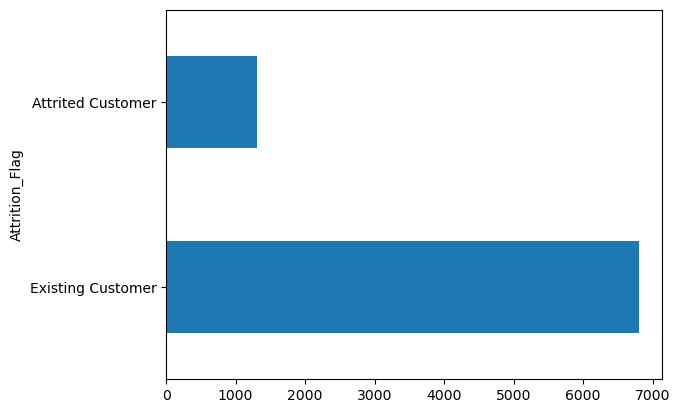

In [68]:
copy_bank_customer_data['Attrition_Flag'].value_counts().plot.barh()

In [69]:
copy_bank_customer_data.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

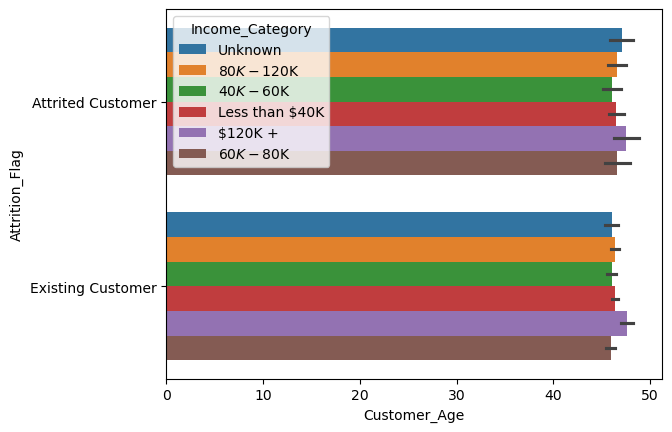

In [70]:
import seaborn as sea
sea.barplot(x='Customer_Age',y='Attrition_Flag',hue='Income_Category', data=copy_bank_customer_data);

<Axes: xlabel='Attrition_Flag', ylabel='Income_Category'>

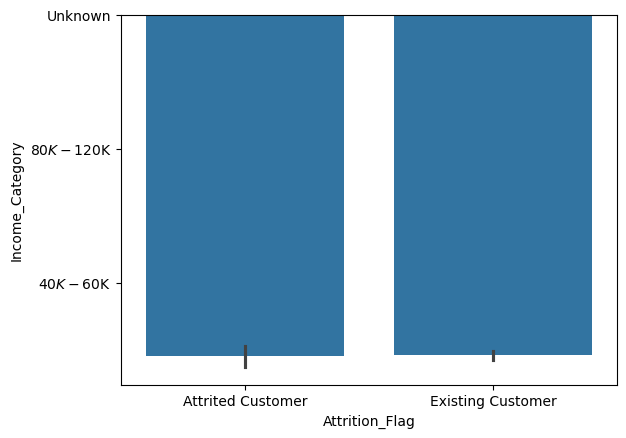

In [71]:
sea.barplot(x='Attrition_Flag',y='Income_Category',data=copy_bank_customer_data)

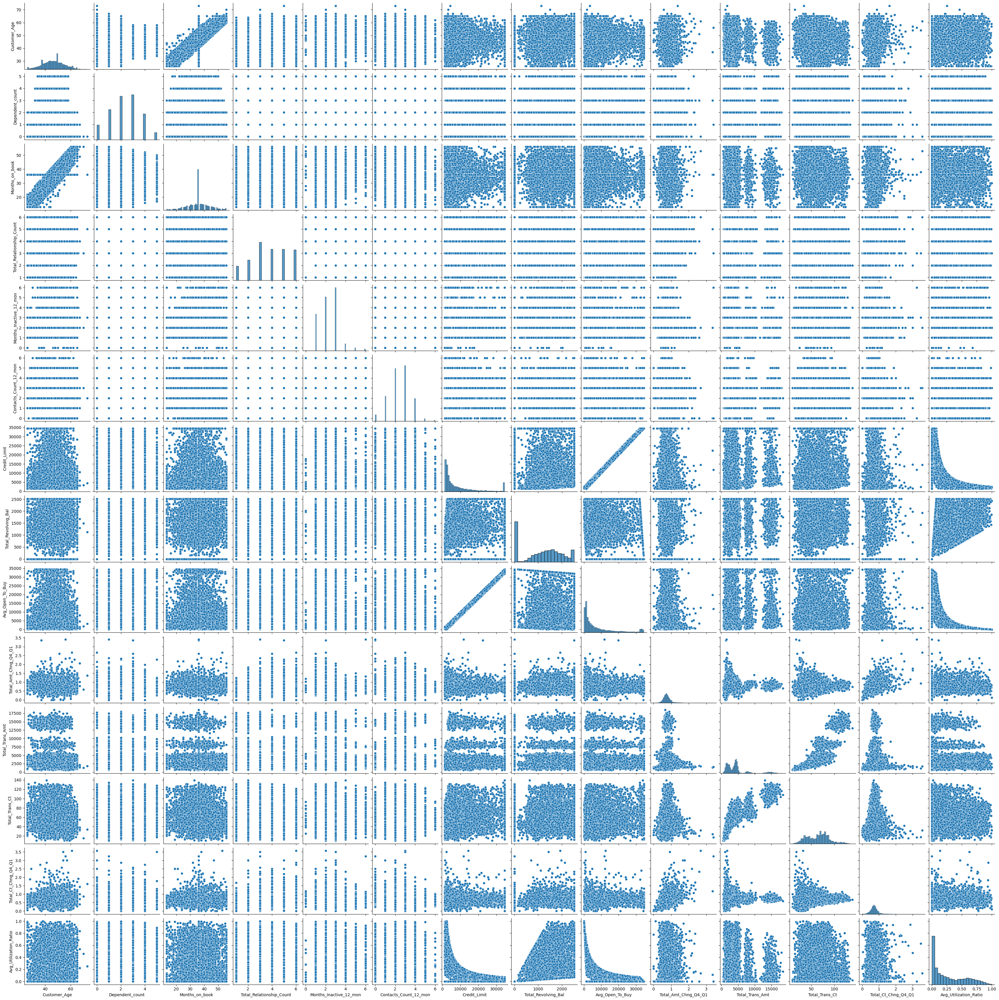

In [72]:
sea.pairplot(copy_bank_customer_data)

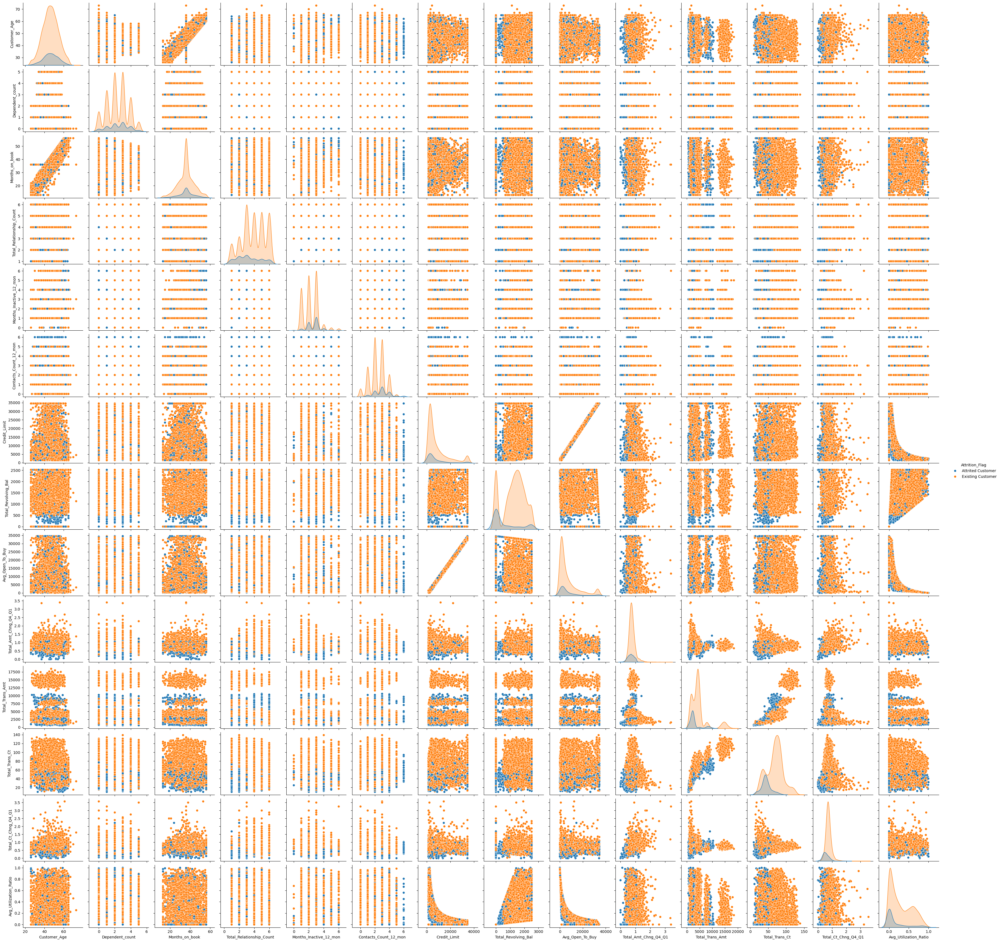

In [73]:
sea.pairplot(copy_bank_customer_data,hue='Attrition_Flag')

In [75]:
copy_bank_customer_data.columns


Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [78]:
from sklearn.preprocessing import LabelEncoder

# Kategorik değişkenleri seç
categorical_cols = copy_bank_customer_data.select_dtypes(include=['object']).columns

# Label Encoding uygula
label_encoder = LabelEncoder()
for col in categorical_cols:
    copy_bank_customer_data[col] = label_encoder.fit_transform(copy_bank_customer_data[col])



In [81]:
copy_bank_customer_data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
1602,0,54,0,3,0,2,5,0,49,6,2,3,13184.0,0,13184.0,1.166,2047,33,0.179,0.000
7791,1,51,1,0,3,2,3,0,45,3,2,3,10648.0,2517,8131.0,0.708,4930,89,0.978,0.236
7177,1,45,0,4,3,2,1,0,29,3,2,1,4595.0,1781,2814.0,0.708,3746,68,0.545,0.388
97,1,53,1,3,1,1,1,0,35,5,3,2,3789.0,1706,2083.0,1.047,1609,42,0.680,0.450
4820,1,48,0,2,2,1,5,0,40,3,2,4,5104.0,736,4368.0,0.679,3943,78,0.696,0.144


In [82]:


# Korelasyon matrisini hesapla
corr_matrix = copy_bank_customer_data.corr()

# 'median_house_value' sütununa göre sıralama
sorted_corr = corr_matrix['Attrition_Flag'].sort_values(ascending=False)

# Sonuçları göster
sorted_corr

Attrition_Flag              1.000000
Total_Trans_Ct              0.376817
Total_Ct_Chng_Q4_Q1         0.298785
Total_Revolving_Bal         0.259135
Total_Trans_Amt             0.174958
Avg_Utilization_Ratio       0.174853
Total_Relationship_Count    0.144225
Total_Amt_Chng_Q4_Q1        0.139358
Gender                      0.040392
Credit_Limit                0.022775
Card_Category               0.007446
Avg_Open_To_Buy            -0.000404
Income_Category            -0.007691
Education_Level            -0.008726
Months_on_book             -0.010829
Customer_Age               -0.015240
Marital_Status             -0.016522
Dependent_count            -0.020101
Months_Inactive_12_mon     -0.156656
Contacts_Count_12_mon      -0.208318
Name: Attrition_Flag, dtype: float64

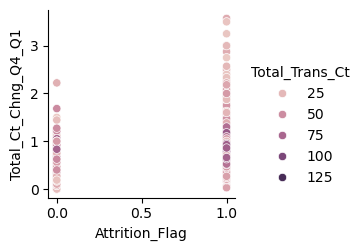

In [88]:
sea.pairplot(x_vars='Attrition_Flag',y_vars='Total_Ct_Chng_Q4_Q1',hue='Total_Trans_Ct',data=copy_bank_customer_data)

<Axes: xlabel='Total_Ct_Chng_Q4_Q1', ylabel='Total_Trans_Ct'>

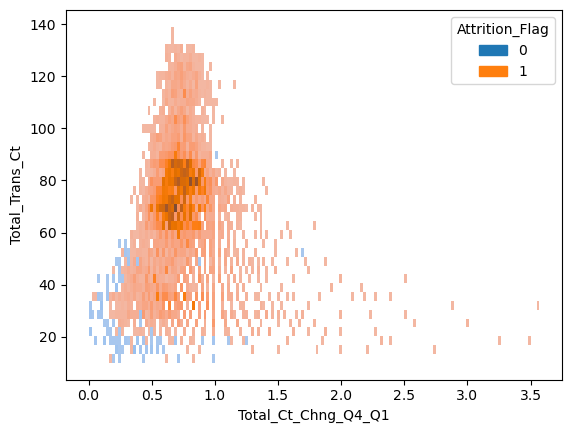

In [89]:
sea.histplot(x='Total_Ct_Chng_Q4_Q1',y='Total_Trans_Ct',hue='Attrition_Flag',data=copy_bank_customer_data)

In [ ]:
"""
yorumlarım;
varsayımlarımın aksine iki üç nitelik corelasyon göstermektedir
bunlar:
Total_Trans_Ct              0.376817
Total_Ct_Chng_Q4_Q1         0.298785
Total_Revolving_Bal         0.259135
bunun üzerine yoğunlaşacağım
"""

array([[<Axes: xlabel='Attrition_Flag', ylabel='Attrition_Flag'>,
        <Axes: xlabel='Total_Trans_Ct', ylabel='Attrition_Flag'>,
        <Axes: xlabel='Total_Ct_Chng_Q4_Q1', ylabel='Attrition_Flag'>,
        <Axes: xlabel='Total_Revolving_Bal', ylabel='Attrition_Flag'>],
       [<Axes: xlabel='Attrition_Flag', ylabel='Total_Trans_Ct'>,
        <Axes: xlabel='Total_Trans_Ct', ylabel='Total_Trans_Ct'>,
        <Axes: xlabel='Total_Ct_Chng_Q4_Q1', ylabel='Total_Trans_Ct'>,
        <Axes: xlabel='Total_Revolving_Bal', ylabel='Total_Trans_Ct'>],
       [<Axes: xlabel='Attrition_Flag', ylabel='Total_Ct_Chng_Q4_Q1'>,
        <Axes: xlabel='Total_Trans_Ct', ylabel='Total_Ct_Chng_Q4_Q1'>,
        <Axes: xlabel='Total_Ct_Chng_Q4_Q1', ylabel='Total_Ct_Chng_Q4_Q1'>,
        <Axes: xlabel='Total_Revolving_Bal', ylabel='Total_Ct_Chng_Q4_Q1'>],
       [<Axes: xlabel='Attrition_Flag', ylabel='Total_Revolving_Bal'>,
        <Axes: xlabel='Total_Trans_Ct', ylabel='Total_Revolving_Bal'>,
        <Axes

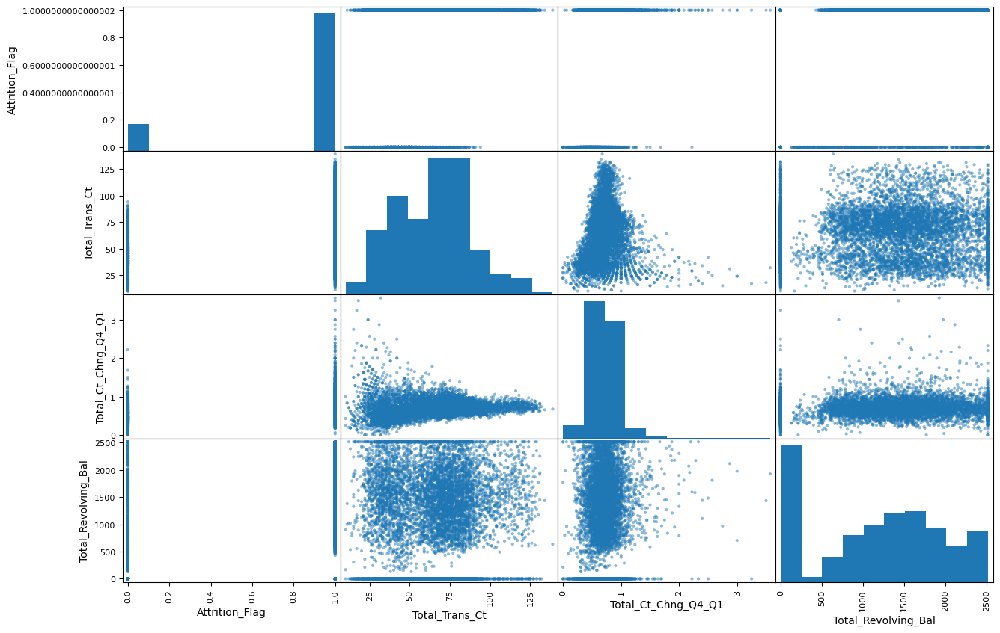

In [90]:
from pandas.plotting import scatter_matrix
attributes = ['Attrition_Flag','Total_Trans_Ct','Total_Ct_Chng_Q4_Q1','Total_Revolving_Bal']
scatter_matrix(copy_bank_customer_data[attributes], figsize= (15,10))

<Axes: xlabel='Attrition_Flag', ylabel='Total_Trans_Ct'>

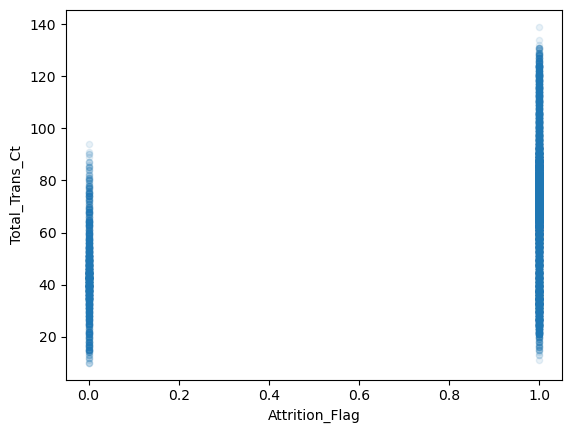

In [91]:
copy_bank_customer_data.plot(kind='scatter',x='Attrition_Flag',y='Total_Trans_Ct',alpha=0.1)

In [ ]:
#one hot encoder dönüşümü yapılacak !!!